<a href="https://colab.research.google.com/github/kr-pushpam/DeepGenerativeModel_Aug24/blob/main/DGM_24_A1_V3_Pk.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [21]:
# Import required libraries
import os
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from PIL import Image
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch.autograd as autograd
from torch.utils.data import random_split

 **1. Train a DC GAN (with an architecture of your choice) on the given data
with the usual GAN loss. Plot the loss curves for the Generator and
Discriminator losses**

Unzip the archieve (butterfly.zip): Since the data is downloaded as a zip file, the first step is to unzip the butterfly.zip file in /content/data folder.

In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [2]:
! pip install gdown

In [3]:
import gdown
import zipfile
import os

# Google Drive file ID from the link you shared
file_id = '1ptNE3JEg6biLd_WXj93tbl1myVefh_Mi'
download_url = f"https://drive.google.com/uc?id={file_id}"

# Download the file
output = '/content/butterfly_dataset.zip'
gdown.download(download_url, output, quiet=False)

# Unzipping the dataset
extracted_path = '/content/butterfly_dataset/'
with zipfile.ZipFile(output, 'r') as zip_ref:
    zip_ref.extractall(extracted_path)

# Check if the extraction was successful
print(os.listdir(extracted_path))


Downloading...
From (original): https://drive.google.com/uc?id=1ptNE3JEg6biLd_WXj93tbl1myVefh_Mi
From (redirected): https://drive.google.com/uc?id=1ptNE3JEg6biLd_WXj93tbl1myVefh_Mi&confirm=t&uuid=db52d996-767e-484f-b6c2-b738b4ac306f
To: /content/butterfly_dataset.zip
100%|██████████| 237M/237M [00:05<00:00, 40.2MB/s]


['test', 'Testing_set.csv', 'train', 'Training_set.csv']


In [ ]:
!unzip /content/butterfly.zip -d /content/dataset


Streaming output truncated to the last 5000 lines.
  inflating: /content/dataset/train/Image_2348.jpg  
  inflating: /content/dataset/train/Image_2349.jpg  
  inflating: /content/dataset/train/Image_235.jpg  
  inflating: /content/dataset/train/Image_2350.jpg  
  inflating: /content/dataset/train/Image_2351.jpg  
  inflating: /content/dataset/train/Image_2352.jpg  
  inflating: /content/dataset/train/Image_2353.jpg  
  inflating: /content/dataset/train/Image_2354.jpg  
  inflating: /content/dataset/train/Image_2355.jpg  
  inflating: /content/dataset/train/Image_2356.jpg  
  inflating: /content/dataset/train/Image_2357.jpg  
  inflating: /content/dataset/train/Image_2358.jpg  
  inflating: /content/dataset/train/Image_2359.jpg  
  inflating: /content/dataset/train/Image_236.jpg  
  inflating: /content/dataset/train/Image_2360.jpg  
  inflating: /content/dataset/train/Image_2361.jpg  
  inflating: /content/dataset/train/Image_2362.jpg  
  inflating: /content/dataset/train/Image_2363.jpg

Count the number of images extracted

In [12]:
Dataset = 'butterfly_dataset'

In [22]:
!find /content/butterfly_dataset/train -type f | wc -l
!find /content/butterfly_dataset/test -type f | wc -l

6499
2786


The CustomDataset class in PyTorch is used to create a custom data loader that maps image filenames from the CSV file to their respective labels and loads the images from a specified directory. It allows flexibility in how data is loaded and preprocessed, especially when the dataset structure doesn’t follow typical folder-label conventions like in ImageFolder.

In [23]:
class CustomDataset(Dataset):
    """
    A custom dataset class to load images and corresponding labels from a CSV file.

    Attributes:
        data_frame (pd.DataFrame): The dataframe containing filenames and labels.
        root_dir (str): The root directory where the images are stored.
        transform (callable, optional): Optional transformations to be applied on the images.
    """

    def __init__(self, csv_file, root_dir, transform=None):
        """
        Initializes the CustomDataset object.

        Args:
            csv_file (str): Path to the CSV file containing image filenames and labels.
            root_dir (str): Directory where the images are stored.
            transform (callable, optional): Optional transform to be applied on the image samples.
        """
        self.data_frame = pd.read_csv(csv_file)  # Read CSV containing filenames and labels
        self.root_dir = root_dir  # Path to the directory containing the images
        self.transform = transform  # Image transformation pipeline

    def __len__(self):
        """
        Returns the total number of samples (images) in the dataset.

        Returns:
            int: The length of the dataset (number of rows in the CSV file).
        """
        return len(self.data_frame)  # The number of rows in the CSV file represents the dataset size

    def __getitem__(self, idx):
        """
        Retrieves an image and its label at the specified index.

        Args:
            idx (int): Index of the sample to retrieve.

        Returns:
            image (Tensor): The transformed image tensor.
            label (str or int): The corresponding label for the image.
        """
        img_name = os.path.join(self.root_dir, self.data_frame.iloc[idx, 0])  # Get image file path
        image = Image.open(img_name).convert("RGB")  # Open the image and ensure it's in RGB mode

        label = self.data_frame.iloc[idx, 1]  # Retrieve the label corresponding to the image

        if self.transform:
            image = self.transform(image)  # Apply transformations to the image

        return image, label  # Return the image and label as a tuple

In [16]:
#Pk
import os
import pandas as pd
from PIL import Image
from torch.utils.data import Dataset
from sklearn.preprocessing import LabelEncoder

class CustomDataset(Dataset):
    """
    A custom dataset class to load images and corresponding labels from a CSV file.

    Attributes:
        data_frame (pd.DataFrame): The dataframe containing filenames and labels.
        root_dir (str): The root directory where the images are stored.
        transform (callable, optional): Optional transformations to be applied on the images.
        label_encoder (LabelEncoder, optional): Optional label encoder to convert string labels to integers.
    """

    def __init__(self, csv_file, root_dir, transform=None, encode_labels=True):
        """
        Initializes the CustomDataset object.

        Args:
            csv_file (str): Path to the CSV file containing image filenames and labels.
            root_dir (str): Directory where the images are stored.
            transform (callable, optional): Optional transform to be applied on the image samples.
            encode_labels (bool): Whether to encode string labels as integers. Default is True.
        """
        self.data_frame = pd.read_csv(csv_file)  # Read CSV containing filenames and labels
        self.root_dir = root_dir  # Path to the directory containing the images
        self.transform = transform  # Image transformation pipeline

        if encode_labels:
            self.label_encoder = LabelEncoder()  # Instantiate a label encoder
            self.data_frame.iloc[:, 1] = self.label_encoder.fit_transform(self.data_frame.iloc[:, 1])  # Encode the labels
        else:
            self.label_encoder = None

    def __len__(self):
        """
        Returns the total number of samples (images) in the dataset.

        Returns:
            int: The length of the dataset (number of rows in the CSV file).
        """
        return len(self.data_frame)

    def __getitem__(self, idx):
        """
        Retrieves an image and its label at the specified index.

        Args:
            idx (int): Index of the sample to retrieve.

        Returns:
            image (Tensor): The transformed image tensor.
            label (int): The corresponding label for the image (encoded if specified).
        """
        img_name = os.path.join(self.root_dir, self.data_frame.iloc[idx, 0])  # Get image file path

        try:
            image = Image.open(img_name).convert("RGB")  # Open the image in RGB mode
        except FileNotFoundError:
            print(f"Image not found at index {idx}: {img_name}")
            return None, None

        label = self.data_frame.iloc[idx, 1]  # Retrieve the label corresponding to the image

        if self.transform:
            image = self.transform(image)  # Apply transformations to the image

        return image, label  # Return the image and label as a tuple


Define the transformations

In [25]:

from torchvision import transforms

transform = transforms.Compose(
    [
        transforms.Resize((64, 64)), # Actual size of the picture 224 * 224. Resizing it to 64 * 64 for better management
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)), # normalization is essential to scale pixel values between -1 and 1
    ]
)

Initialize the dataset

In [ ]:
!find /content/dataset/train -type f | wc -l
!find /content/dataset/test -type f | wc -l

6499
2786


In [ ]:
train_csv = '/content/dataset/Training_set.csv'
test_csv = '/content/dataset/Testing_set.csv'

In [ ]:
train_set = CustomDataset(csv_file=train_csv, root_dir='/content/dataset/train', transform=transform)
test_set = CustomDataset(csv_file=test_csv, root_dir='/content/dataset/test', transform=transform)

In [26]:
## PK
train_csv = '/content/butterfly_dataset/Training_set.csv'
test_csv = '/content/butterfly_dataset/Testing_set.csv'
train_set = CustomDataset(csv_file=train_csv, root_dir='/content/butterfly_dataset/train', transform=transform)
test_set = CustomDataset(csv_file=test_csv, root_dir='/content/butterfly_dataset/test', transform=transform)

Verify the data

In [27]:
train_set[0]

(tensor([[[-0.8039, -0.7961, -0.7725,  ..., -0.8588, -0.7490, -0.5686],
          [-0.8353, -0.8196, -0.7961,  ..., -0.7490, -0.5294, -0.3333],
          [-0.8275, -0.7961, -0.7804,  ..., -0.6157, -0.4039, -0.2549],
          ...,
          [-0.5373, -0.4039, -0.7725,  ..., -0.4039, -0.3647, -0.4118],
          [-0.4588, -0.4039, -0.7647,  ..., -0.6157, -0.5608, -0.4824],
          [-0.4275, -0.4118, -0.7647,  ..., -0.7725, -0.7412, -0.6627]],
 
         [[-0.6627, -0.6627, -0.6392,  ..., -0.7725, -0.6627, -0.4824],
          [-0.6706, -0.6784, -0.6627,  ..., -0.6627, -0.4588, -0.2706],
          [-0.7020, -0.6863, -0.6627,  ..., -0.5294, -0.3176, -0.1686],
          ...,
          [-0.2549, -0.2235, -0.7020,  ..., -0.1529, -0.1137, -0.1608],
          [-0.1608, -0.2078, -0.6784,  ..., -0.4667, -0.3961, -0.2941],
          [-0.1373, -0.2157, -0.6549,  ..., -0.6549, -0.5922, -0.4902]],
 
         [[-0.7804, -0.7804, -0.7490,  ..., -0.8667, -0.8118, -0.6941],
          [-0.8196, -0.8118,

In [28]:
image_tensor = train_set[0][0]
pixel_size = image_tensor.shape  # This will give us (channels, height, width)
print(f"Image size (channels, height, width): {pixel_size}")

Image size (channels, height, width): torch.Size([3, 64, 64])


In [29]:
print(f"Number of images in train_set: {len(train_set)}")
print(f"Number of images in test_set: {len(test_set)}")

Number of images in train_set: 6499
Number of images in test_set: 2786


We cannot put all the images at once to training model. So we need to send them in batches. DataLoader class is designed for the same.Keeping batch size = 64 to keep computation balanced.

In [30]:
train_loader = DataLoader(train_set, batch_size=32, shuffle=True, num_workers=4)
test_loader = DataLoader(test_set, batch_size=32, shuffle=False, num_workers=4)


### GenBlock and DisBlock along with Generator and Discriminator
As we are all aware, Gen AI codes work with Generator and Discriminator classes. Both classes are "fighting" with each other (Generator targets to 'fool' Discriminator and Discriminator tries to catch the 'frogery' of Generator). We can directly create a Generator and Discriminator class and define required neural network inside it. However, in our view, it is not a very clean way to do the things. Hence, here we will define 'GenBlock' and 'DisBlock' classes, which will contain the required code base and we can use these classes again and again whereever Generator and Discriminator require these. So in short, we are encapsulating the classes.

In [ ]:
class GenBlock(nn.Module):
    """
    A building block for the Generator.
    Each block consists of a transposed convolution, followed by batch normalization and ReLU activation.
    """
    def __init__(self, in_channels, out_channels, kernel_size=4, stride=2, padding=1):
        """
        Args:
            in_channels (int): Number of input channels.
            out_channels (int): Number of output channels.
            kernel_size (int): Kernel size for the transposed convolution. Default is 4.
            stride (int): Stride for the transposed convolution. Default is 2.
            padding (int): Padding for the transposed convolution. Default is 1.
        """
        super(GenBlock, self).__init__()

        # Transposed convolution layer
        self.block = nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)  # Use in-place operations to save memory
        )

    def forward(self, x):
        """
        Forward pass through the GenBlock.

        Args:
            x (Tensor): Input tensor of shape (batch_size, in_channels, height, width).

        Returns:
            Tensor: Output tensor after transposed convolution, batch normalization, and ReLU.
        """
        return self.block(x)


In [ ]:
class Generator(nn.Module):
    """
    DCGAN Generator class.
    It uses several GenBlocks to upscale a noise vector into an image.
    """
    def __init__(self, latent_dim=100, image_channels=3, feature_maps_g=64):
        """
        Args:
            latent_dim (int): Dimension of the input noise vector. Default is 100.
            image_channels (int): Number of output image channels (3 for RGB). Default is 3.
            feature_maps_g (int): Number of feature maps in the generator. Default is 64.
        """
        super(Generator, self).__init__()

        self.net = nn.Sequential(
            GenBlock(latent_dim, feature_maps_g * 8, 4, 1, 0),  # L1 -From latent vector to 4x4
            GenBlock(feature_maps_g * 8, feature_maps_g * 4),  # L2 - From 4x4 to 8x8
            GenBlock(feature_maps_g * 4, feature_maps_g * 2),  # L3 - From 8x8 to 16x16
            GenBlock(feature_maps_g * 2, feature_maps_g),      # From 16x16 to 32x32
            nn.ConvTranspose2d(feature_maps_g, image_channels, 4, 2, 1),  # From 32x32 to 64x64
            nn.Tanh()
        )


    def forward(self, x):
        """
        Forward pass through the Generator network.

        Args:
            x (Tensor): Input tensor (latent noise vector).

        Returns:
            Tensor: Generated image tensor.
        """
        return self.net(x)


While coding 'DisBlock', we have used two parameters which needs explanation.

LeakyReLU: For discriminator block, we have used LeakyReLU method. If too many neurons give negative values, gradient can become 0 while back propagating, which is called "dying ReLU problem". LeakyReLU, in the other hand, adding a very small value instead of completely zero-ing out element. We have used this in Discriminator, because it acts as "critic network" and very important to be very effective so it can identify real and synthetic data points.

dropout: This parameter is used to avoid overfitting.

In [ ]:
class DisBlock(nn.Module):
    """
    A building block for the Discriminator.
    Each block consists of a convolution, followed by LeakyReLU activation.
    """
    def __init__(self, in_channels, out_channels, kernel_size=4, stride=2, padding=1):
        """
        Args:
            in_channels (int): Number of input channels.
            out_channels (int): Number of output channels.
            kernel_size (int): Kernel size for the convolution. Default is 4.
            stride (int): Stride for the convolution. Default is 2.
            padding (int): Padding for the convolution. Default is 1.
        """
        super(DisBlock, self).__init__()

        # Convolutional layer (without batch normalization for WGAN-GP)
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
            nn.LeakyReLU(0.2, inplace=True),  # LeakyReLU to allow for small negative gradients
            nn.Dropout(0.2)  # Dropout to prevent overfitting
        )

    def forward(self, x):
        """
        Forward pass through the DisBlock.

        Args:
            x (Tensor): Input tensor of shape (batch_size, in_channels, height, width).

        Returns:
            Tensor: Output tensor after convolution and LeakyReLU.
        """
        return self.block(x)

In [ ]:
class Discriminator(nn.Module):
    """
    WGAN-GP Discriminator (Critic) class.
    It uses several DisBlocks to downsample an image and return a raw score.
    """
    def __init__(self, image_channels=3, feature_maps_d=64):
        """
        Args:
            image_channels (int): Number of input image channels (3 for RGB). Default is 3.
            feature_maps_d (int): Number of feature maps in the discriminator. Default is 64.
        """
        super(Discriminator, self).__init__()

        self.net = nn.Sequential(
            # Input: image_channels x 64 x 64 -> feature_maps_d x 32 x 32
            nn.Conv2d(image_channels, feature_maps_d, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),  # No batch normalization for the first layer

            # feature_maps_d x 32 x 32 -> feature_maps_d * 2 x 16 x 16
            DisBlock(feature_maps_d, feature_maps_d * 2),

            # feature_maps_d * 2 x 16 x 16 -> feature_maps_d * 4 x 8 x 8
            DisBlock(feature_maps_d * 2, feature_maps_d * 4),

            # feature_maps_d * 4 x 8 x 8 -> feature_maps_d * 8 x 4 x 4
            DisBlock(feature_maps_d * 4, feature_maps_d * 8),

            # feature_maps_d * 8 x 4 x 4 -> 1 x 1 x 1 (output scalar score)
            nn.Conv2d(feature_maps_d * 8, 1, kernel_size=4, stride=1, padding=0)  # Output raw score
        )

    def forward(self, x):
        """
        Forward pass through the Discriminator network.

        Args:
            x (Tensor): Input tensor (real or fake image).

        Returns:
            Tensor: Output scalar score indicating the realism of the image.
        """
        return self.net(x).view(-1)  # Flatten the output to a single scalar per image

### Model initialization

- Initializing generator and discriminator instances. As we are already aware, goal of generator will be to create the synthetic data as real as possible so discriminator cannot identify the 'syntheticity' of the data. On the other hand, goal of discriminator will be to 'fail' the generator.

- Here we are using Wasserstein loss loss function. Both generator and discriminator are using same loss function, however the goals are different.

- In Wasserstein GANs (WGAN), enforcing the Lipschitz constraint on the discriminator is crucial for stable training. Originally, this was done by clipping the weights of the discriminator within a fixed range, but this approach can lead to issues such as vanishing gradients or overly constrained models. A more robust alternative is the Gradient Penalty (WGAN-GP) method, which replaces weight clipping with a penalty on the gradient norm of the discriminator's output with respect to its input. This ensures that the gradients remain smooth, providing a better approximation to the Wasserstein distance while maintaining stability during training. Gradient penalty works by computing the norm of the gradients for an interpolated sample between real and fake images, encouraging the gradient norm to be close to 1. This effectively enforces the Lipschitz constraint without the drawbacks of weight clipping.

In [ ]:
def gradient_penalty(discriminator, real_images, fake_images, device="cuda"):
    """
    Compute the gradient penalty for WGAN-GP to enforce the Lipschitz constraint.

    Gradient penalty helps stabilize GAN training by ensuring the discriminator's
    gradients have a norm close to 1. This prevents issues that arise from
    weight clipping, which can cause vanishing gradients and limit the model's capacity.

    Args:
        discriminator (nn.Module): The discriminator (critic) model.
        real_images (torch.Tensor): A batch of real images.
        fake_images (torch.Tensor): A batch of fake images generated by the generator.
        device (str): The device to run the calculations on, default is "cuda".

    Returns:
        torch.Tensor: The computed gradient penalty term, a scalar value to be added
        to the discriminator's loss function.
    """
    batch_size = real_images.size(0)

    # Generate random epsilon for interpolation
    epsilon = torch.rand(batch_size, 1, 1, 1, device=device)
    epsilon = epsilon.expand_as(real_images)

    # Interpolation between real and fake images
    interpolated = epsilon * real_images + (1 - epsilon) * fake_images
    interpolated = interpolated.requires_grad_(True).to(device)

    # Forward pass through discriminator
    interpolated_output = discriminator(interpolated)

    # Calculate gradients w.r.t. the interpolated images
    gradients = autograd.grad(
        outputs=interpolated_output,
        inputs=interpolated,
        grad_outputs=torch.ones(interpolated_output.size(), device=device),
        create_graph=True,
        retain_graph=True,
        only_inputs=True
    )[0]

    # Flatten gradients and compute gradient penalty (||gradients||_2 - 1)^2
    gradients = gradients.view(batch_size, -1)
    gradient_penalty = ((gradients.norm(2, dim=1) - 1) ** 2).mean()

    return gradient_penalty

In [ ]:
# Create the instance of 'Generator' and 'Discriminator' classes
generator = Generator()
discriminator = Discriminator()

# Defining the optimizers (using RMSprop for WGAN)
optimizer_gen = optim.RMSprop(generator.parameters(), lr=0.00002)
optimizer_dis = optim.RMSprop(discriminator.parameters(), lr=0.00002)

# Weight clipping range for WGAN's Lipschitz constraint
weight_clip = 0.01

### Training the GAN
Now that we have the generator, discriminator, loss function, and optimizers defined, the next step is to create the training loop. This is where the actual "game" between the generator and discriminator happens.

n each training iteration:

Training the Discriminator:
The discriminator is trained to correctly distinguish between real images from the dataset and fake images generated by the generator.
We pass real images from the dataset and assign them the label "1" (real). We also generate fake images using the generator and assign them the label "0" (fake). The discriminator tries to maximize the difference between real and fake.
Training the Generator:
The generator is trained to "fool" the discriminator. We generate fake images from random noise, pass them through the discriminator, and try to make the discriminator classify them as "real" (label "1").
The generator's loss is computed based on how well it can trick the discriminator.

Using device: cuda
Epoch [0/10] | Step [0/204] | D Loss: -4.8915 | G Loss: 12.3377
Epoch [0/10] | Step [100/204] | D Loss: -39.1137 | G Loss: 31.3016
Epoch [0/10] | Step [200/204] | D Loss: -44.9565 | G Loss: 8.1146


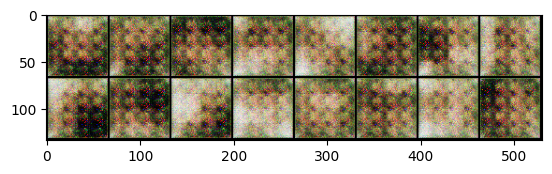

Epoch [1/10] | Step [0/204] | D Loss: -45.6232 | G Loss: 0.3962
Epoch [1/10] | Step [100/204] | D Loss: -40.3370 | G Loss: 9.4660
Epoch [1/10] | Step [200/204] | D Loss: -36.9136 | G Loss: 4.4003


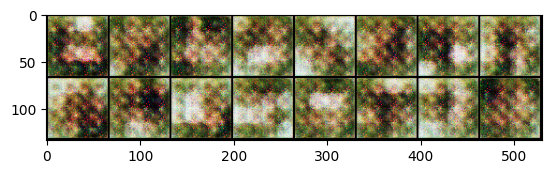

Epoch [2/10] | Step [0/204] | D Loss: -38.4146 | G Loss: 25.1020
Epoch [2/10] | Step [100/204] | D Loss: -32.9047 | G Loss: -6.7163
Epoch [2/10] | Step [200/204] | D Loss: -25.8256 | G Loss: -8.7134


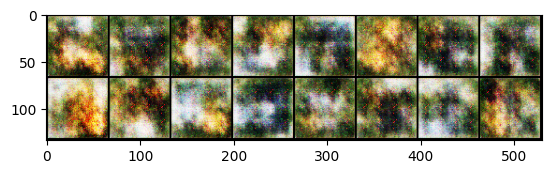

Epoch [3/10] | Step [0/204] | D Loss: -23.3439 | G Loss: -17.3942
Epoch [3/10] | Step [100/204] | D Loss: -20.6946 | G Loss: -0.8504
Epoch [3/10] | Step [200/204] | D Loss: -22.5261 | G Loss: -8.0715


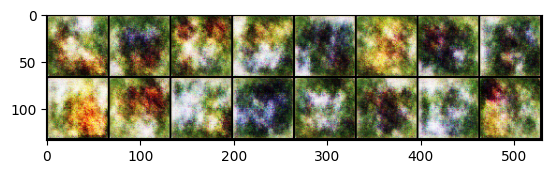

Epoch [4/10] | Step [0/204] | D Loss: -19.8993 | G Loss: -31.6964
Epoch [4/10] | Step [100/204] | D Loss: -19.7188 | G Loss: -28.1831
Epoch [4/10] | Step [200/204] | D Loss: -19.5353 | G Loss: -16.0576


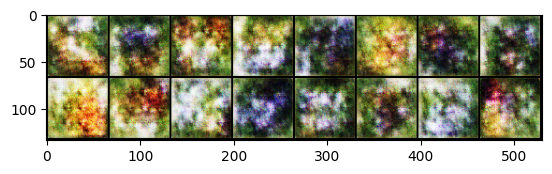

Epoch [5/10] | Step [0/204] | D Loss: -19.0781 | G Loss: -22.1097
Epoch [5/10] | Step [100/204] | D Loss: -21.6204 | G Loss: -29.4758
Epoch [5/10] | Step [200/204] | D Loss: -20.2844 | G Loss: -43.7014


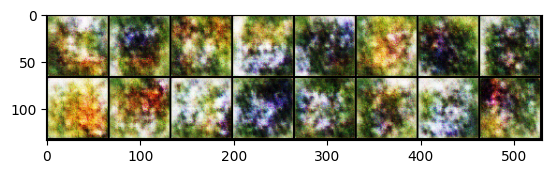

Epoch [6/10] | Step [0/204] | D Loss: -19.1542 | G Loss: -16.9209
Epoch [6/10] | Step [100/204] | D Loss: -16.1259 | G Loss: -19.2061
Epoch [6/10] | Step [200/204] | D Loss: -17.0389 | G Loss: -24.7931


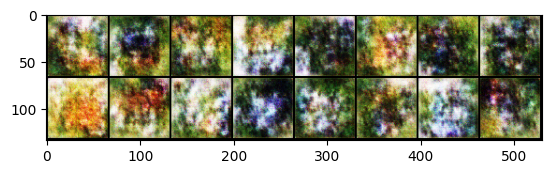

Epoch [7/10] | Step [0/204] | D Loss: -14.6758 | G Loss: -36.2362
Epoch [7/10] | Step [100/204] | D Loss: -20.7736 | G Loss: -38.1772
Epoch [7/10] | Step [200/204] | D Loss: -18.9290 | G Loss: -32.3182


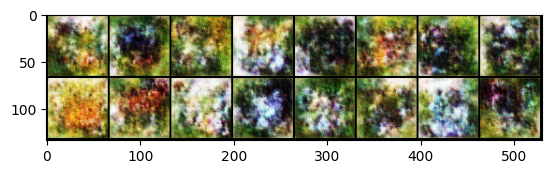

Epoch [8/10] | Step [0/204] | D Loss: -15.0243 | G Loss: -34.9311
Epoch [8/10] | Step [100/204] | D Loss: -17.8836 | G Loss: -30.4333
Epoch [8/10] | Step [200/204] | D Loss: -19.8703 | G Loss: -29.3823


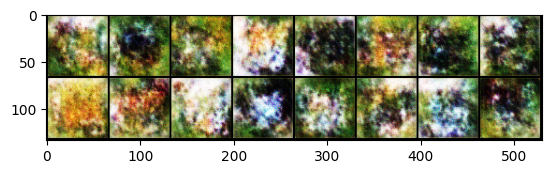

Epoch [9/10] | Step [0/204] | D Loss: -15.8669 | G Loss: -33.4858
Epoch [9/10] | Step [100/204] | D Loss: -17.2558 | G Loss: -36.9769
Epoch [9/10] | Step [200/204] | D Loss: -16.1315 | G Loss: -23.0881


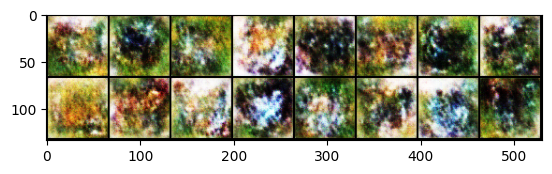

In [ ]:
# Set device to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f'Using device: {device}')

# Move generator and discriminator to the device (GPU or CPU)
generator.to(device)
discriminator.to(device)

# Hyperparameters
epochs = 10  # Number of training epochs
batch_size = 32
latent_dim = 100  # Size of the noise vector (input to generator)
critic_iterations = 10  # Train critic 5 times for every 1 generator update
lambda_gp = 10  # Gradient penalty weight for WGAN-GP

# Create fixed noise for visualization later
fixed_noise = torch.randn(16, latent_dim, 1, 1, device=device)

# Lists to store losses for plotting
gen_losses = []
dis_losses = []

# Training Loop
for epoch in range(epochs):
    for i, (real_images, _) in enumerate(train_loader):
        real_images = real_images.to(device)
        batch_size = real_images.size(0)

        #### Train Discriminator (Critic) ####
        for _ in range(critic_iterations):
            # Generate fake images
            noise = torch.randn(batch_size, latent_dim, 1, 1, device=device)
            fake_images = generator(noise)

            # Critic loss: WGAN-GP loss for real and fake images
            optimizer_dis.zero_grad()

            # Wasserstein loss: real images (maximize output, i.e., minimize negative)
            loss_real = -torch.mean(discriminator(real_images))

            # Wasserstein loss: fake images (minimize output)
            loss_fake = torch.mean(discriminator(fake_images.detach()))

            # Gradient Penalty
            gp = gradient_penalty(discriminator, real_images, fake_images, device=device)

            # Total critic loss (real + fake + gradient penalty)
            loss_dis = loss_real + loss_fake + lambda_gp * gp
            loss_dis.backward()
            optimizer_dis.step()

        #### Train Generator ####
        optimizer_gen.zero_grad()

        # Generate fake images
        noise = torch.randn(batch_size, latent_dim, 1, 1, device=device)
        fake_images = generator(noise)

        # Generator loss: WGAN generator loss (minimize the negative critic output)
        loss_gen = -torch.mean(discriminator(fake_images))
        loss_gen.backward()
        optimizer_gen.step()

        # Store losses
        gen_losses.append(loss_gen.item())
        dis_losses.append(loss_dis.item())

        # Print progress every 100 batches
        if i % 100 == 0:
            print(f'Epoch [{epoch}/{epochs}] | Step [{i}/{len(train_loader)}] | '
                  f'D Loss: {loss_dis.item():.4f} | G Loss: {loss_gen.item():.4f}')

    # Generate and save some images at the end of each epoch for visualization
    with torch.no_grad():
        fake_images = generator(fixed_noise).detach().cpu()
        grid = torchvision.utils.make_grid(fake_images, padding=2, normalize=True)
        plt.imshow(np.transpose(grid, (1, 2, 0)))
        plt.show()


Plot the generator and discriminator loss curves

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(gen_losses, label="Generator Loss")
plt.plot(dis_losses, label="Discriminator Loss")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.title("Generator and Discriminator Loss During Training")
plt.legend()
plt.show()

NameError: name 'gen_losses' is not defined

<Figure size 1000x500 with 0 Axes>

### 2. Plot a 10 by 10 grid of images for generated images.

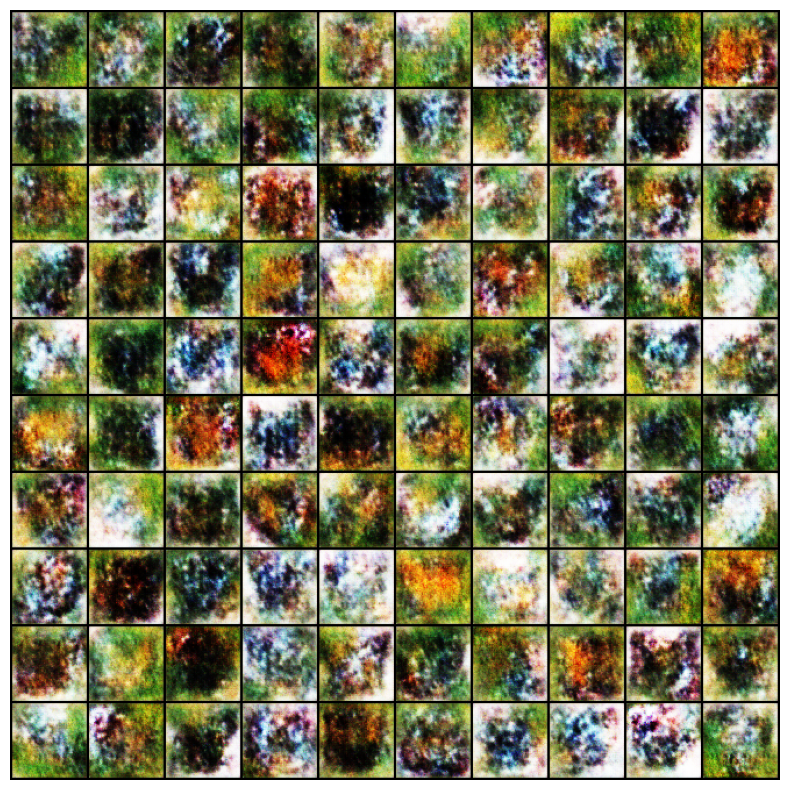

In [ ]:
with torch.no_grad():
    # Generate 100 images for a 10x10 grid
    noise = torch.randn(100, latent_dim, 1, 1, device=device)
    generated_images = generator(noise)

    # Create a 10x10 grid of images
    grid = torchvision.utils.make_grid(generated_images, nrow=10, padding=2, normalize=True)

    # Plot the 10x10 grid of images
    plt.figure(figsize=(10, 10))
    plt.imshow(np.transpose(grid.cpu(), (1, 2, 0)))  # Transpose the image dimensions for matplotlib
    plt.axis("off")  # Turn off the axis
    plt.show()

**3. Vary the number of times the generator and discriminator is trained and
document the outcome.**

Unzip the archieve (animal.zip): Since the data is downloaded as a zip file, the first step is to unzip the animal.zip file in /content/data_animal folder.

experiment with three different scenarios:

*  Equal training of the generator and discriminator (critic).
*  Training the generator 5 times for every 1 discriminator update.
*  Training the discriminator 5 times for every 1 generator update.

Using device: cuda
Training with equal updates (1:1)...
Epoch [0/10] | Step [0/204] | D Loss: 9.5857 | G Loss: 0.1433
Epoch [0/10] | Step [100/204] | D Loss: -28.1536 | G Loss: 30.1685
Epoch [0/10] | Step [200/204] | D Loss: -31.3546 | G Loss: 7.5865


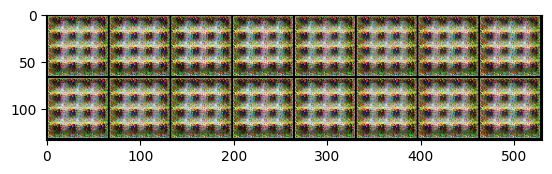

Epoch [1/10] | Step [0/204] | D Loss: -32.0026 | G Loss: 6.1942
Epoch [1/10] | Step [100/204] | D Loss: -37.8355 | G Loss: 26.2884
Epoch [1/10] | Step [200/204] | D Loss: -26.4513 | G Loss: 4.2402


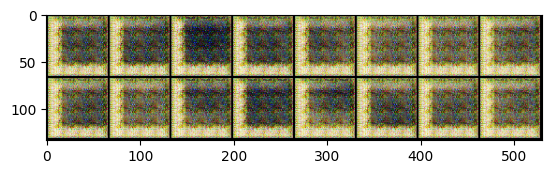

Epoch [2/10] | Step [0/204] | D Loss: -22.1561 | G Loss: 6.0759
Epoch [2/10] | Step [100/204] | D Loss: 3.6459 | G Loss: -6.7522
Epoch [2/10] | Step [200/204] | D Loss: -5.1128 | G Loss: -4.0113


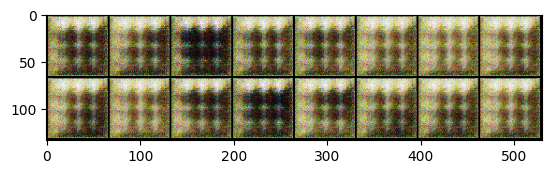

Epoch [3/10] | Step [0/204] | D Loss: -7.8021 | G Loss: -3.7100
Epoch [3/10] | Step [100/204] | D Loss: 9.5126 | G Loss: -9.4041
Epoch [3/10] | Step [200/204] | D Loss: 3.6137 | G Loss: -14.1197


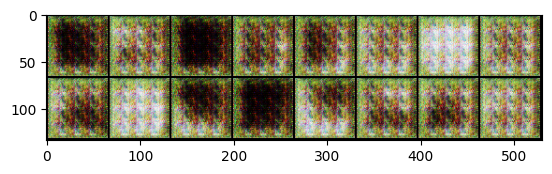

Epoch [4/10] | Step [0/204] | D Loss: 1.2027 | G Loss: -8.3184
Epoch [4/10] | Step [100/204] | D Loss: -0.1115 | G Loss: 6.1229
Epoch [4/10] | Step [200/204] | D Loss: 0.2075 | G Loss: -11.5405


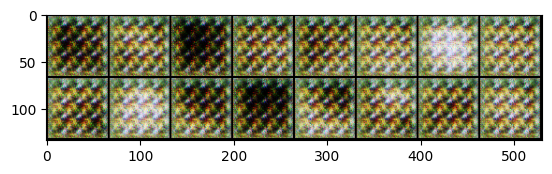

Epoch [5/10] | Step [0/204] | D Loss: -2.0375 | G Loss: 0.8638
Epoch [5/10] | Step [100/204] | D Loss: -1.4698 | G Loss: 4.1660
Epoch [5/10] | Step [200/204] | D Loss: 0.5771 | G Loss: 5.3059


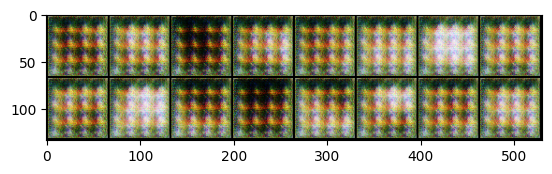

Epoch [6/10] | Step [0/204] | D Loss: 0.1269 | G Loss: 7.3040
Epoch [6/10] | Step [100/204] | D Loss: -3.6022 | G Loss: 2.4687
Epoch [6/10] | Step [200/204] | D Loss: -1.7605 | G Loss: 0.1801


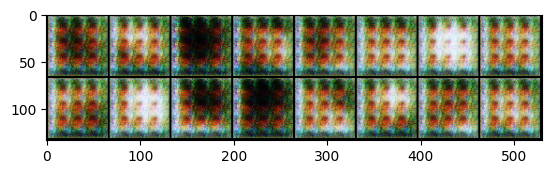

Epoch [7/10] | Step [0/204] | D Loss: -4.7940 | G Loss: 6.1838
Epoch [7/10] | Step [100/204] | D Loss: -4.7330 | G Loss: -8.5993
Epoch [7/10] | Step [200/204] | D Loss: -2.2847 | G Loss: -5.1545


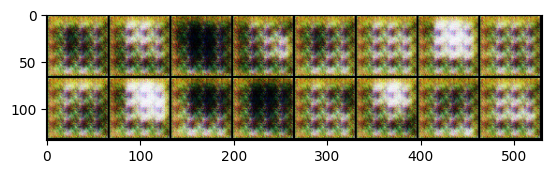

Epoch [8/10] | Step [0/204] | D Loss: -4.2874 | G Loss: -7.1436
Epoch [8/10] | Step [100/204] | D Loss: -3.0140 | G Loss: -20.9271
Epoch [8/10] | Step [200/204] | D Loss: -4.4627 | G Loss: 7.2429


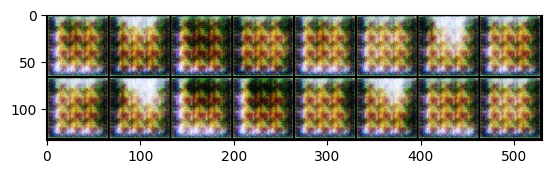

Epoch [9/10] | Step [0/204] | D Loss: -8.4791 | G Loss: 13.4188
Epoch [9/10] | Step [100/204] | D Loss: -8.1162 | G Loss: 3.2459
Epoch [9/10] | Step [200/204] | D Loss: -6.2434 | G Loss: -1.0662


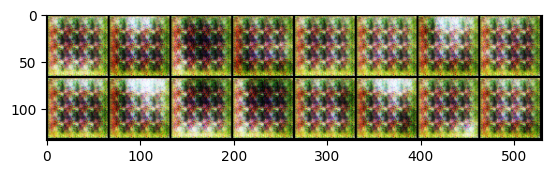

Training generator 5 times per discriminator (5:1)...
Epoch [0/10] | Step [0/204] | D Loss: -3.6757 | G Loss: -9.3313
Epoch [0/10] | Step [100/204] | D Loss: -2.4545 | G Loss: -5.3191
Epoch [0/10] | Step [200/204] | D Loss: 6.1120 | G Loss: -2.6126


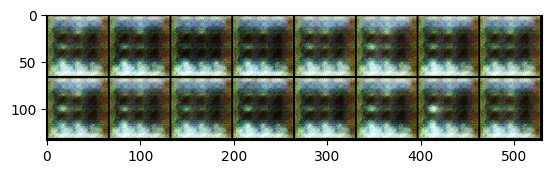

Epoch [1/10] | Step [0/204] | D Loss: 8.8263 | G Loss: 14.0560
Epoch [1/10] | Step [100/204] | D Loss: -1.4525 | G Loss: -20.1353
Epoch [1/10] | Step [200/204] | D Loss: -3.3456 | G Loss: -11.4442


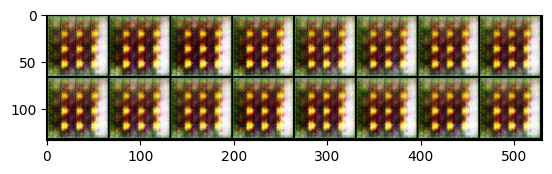

Epoch [2/10] | Step [0/204] | D Loss: 6.9991 | G Loss: -8.4589
Epoch [2/10] | Step [100/204] | D Loss: 6.2819 | G Loss: -4.6766
Epoch [2/10] | Step [200/204] | D Loss: 2.5867 | G Loss: -14.8104


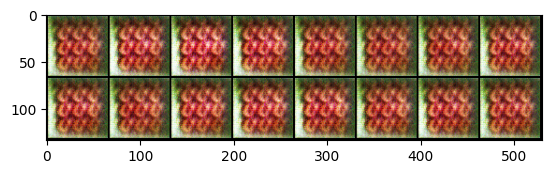

Epoch [3/10] | Step [0/204] | D Loss: -0.8170 | G Loss: -9.2804
Epoch [3/10] | Step [100/204] | D Loss: 5.4818 | G Loss: 1.6768
Epoch [3/10] | Step [200/204] | D Loss: 7.1031 | G Loss: 0.0871


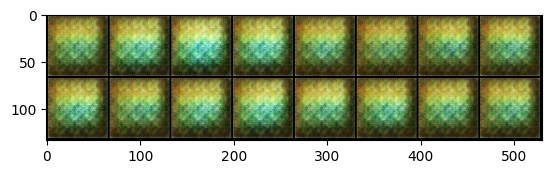

Epoch [4/10] | Step [0/204] | D Loss: 5.6723 | G Loss: 6.4657
Epoch [4/10] | Step [100/204] | D Loss: 3.2006 | G Loss: -3.4469
Epoch [4/10] | Step [200/204] | D Loss: 6.8476 | G Loss: -8.9589


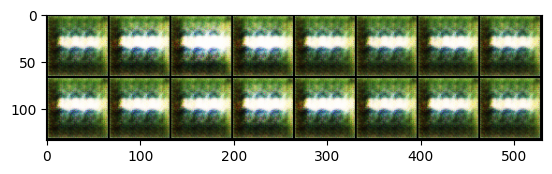

Epoch [5/10] | Step [0/204] | D Loss: 5.5928 | G Loss: -2.9017
Epoch [5/10] | Step [100/204] | D Loss: 1.9645 | G Loss: 5.8262
Epoch [5/10] | Step [200/204] | D Loss: 5.7610 | G Loss: -3.2158


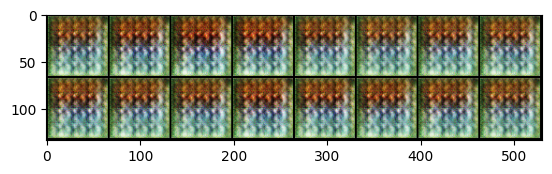

Epoch [6/10] | Step [0/204] | D Loss: 3.7284 | G Loss: -2.6589
Epoch [6/10] | Step [100/204] | D Loss: 1.6711 | G Loss: -5.6973
Epoch [6/10] | Step [200/204] | D Loss: 8.1759 | G Loss: -15.8612


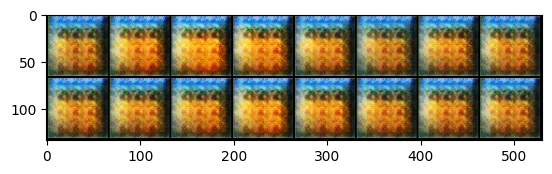

Epoch [7/10] | Step [0/204] | D Loss: 4.1325 | G Loss: -12.7115
Epoch [7/10] | Step [100/204] | D Loss: 5.9614 | G Loss: 2.2031
Epoch [7/10] | Step [200/204] | D Loss: -1.9286 | G Loss: 5.0874


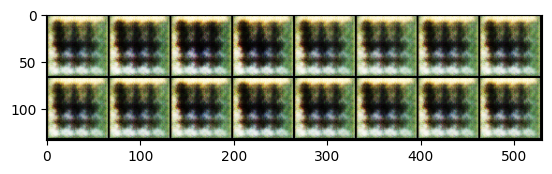

Epoch [8/10] | Step [0/204] | D Loss: 3.3371 | G Loss: 2.7498
Epoch [8/10] | Step [100/204] | D Loss: -0.4563 | G Loss: -2.1823
Epoch [8/10] | Step [200/204] | D Loss: 4.2137 | G Loss: 2.1417


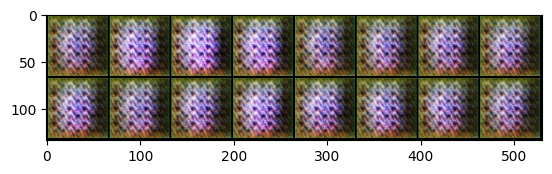

Epoch [9/10] | Step [0/204] | D Loss: 4.6201 | G Loss: -2.0826
Epoch [9/10] | Step [100/204] | D Loss: 5.8068 | G Loss: -3.1631
Epoch [9/10] | Step [200/204] | D Loss: 2.9858 | G Loss: -9.8802


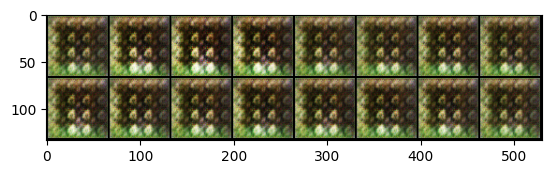

Training discriminator 5 times per generator (1:5)...
Epoch [0/10] | Step [0/204] | D Loss: -13.0547 | G Loss: 40.3068
Epoch [0/10] | Step [100/204] | D Loss: -15.7172 | G Loss: -8.1520
Epoch [0/10] | Step [200/204] | D Loss: -28.1795 | G Loss: -41.3883


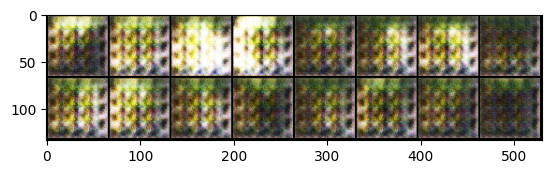

Epoch [1/10] | Step [0/204] | D Loss: -26.2870 | G Loss: -36.9777
Epoch [1/10] | Step [100/204] | D Loss: -28.4724 | G Loss: -35.9626
Epoch [1/10] | Step [200/204] | D Loss: -20.9961 | G Loss: -51.6194


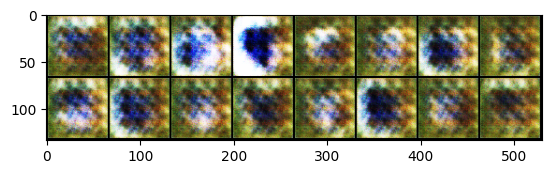

Epoch [2/10] | Step [0/204] | D Loss: -22.4972 | G Loss: -48.4250
Epoch [2/10] | Step [100/204] | D Loss: -10.8536 | G Loss: -19.7887
Epoch [2/10] | Step [200/204] | D Loss: -14.4554 | G Loss: -37.4368


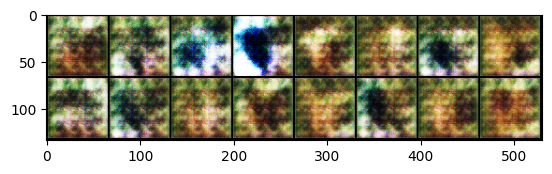

Epoch [3/10] | Step [0/204] | D Loss: -9.8685 | G Loss: -37.1700
Epoch [3/10] | Step [100/204] | D Loss: -17.1465 | G Loss: -47.2663
Epoch [3/10] | Step [200/204] | D Loss: -17.4924 | G Loss: -19.2049


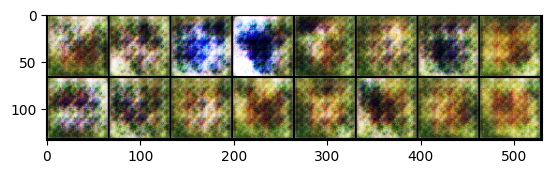

Epoch [4/10] | Step [0/204] | D Loss: -14.0363 | G Loss: -12.6336
Epoch [4/10] | Step [100/204] | D Loss: -14.9216 | G Loss: -37.8878
Epoch [4/10] | Step [200/204] | D Loss: -20.5347 | G Loss: 25.4682


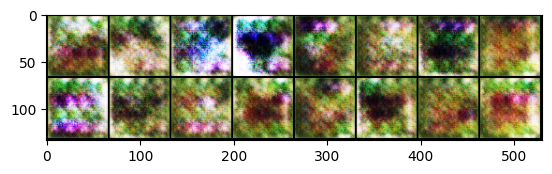

Epoch [5/10] | Step [0/204] | D Loss: -12.1970 | G Loss: -46.1733
Epoch [5/10] | Step [100/204] | D Loss: -14.2427 | G Loss: -54.6833
Epoch [5/10] | Step [200/204] | D Loss: -10.9553 | G Loss: -39.2498


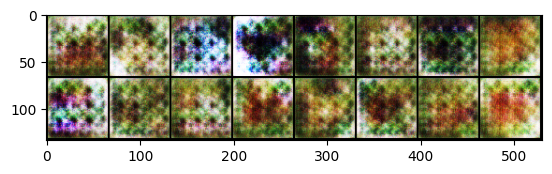

Epoch [6/10] | Step [0/204] | D Loss: -11.2516 | G Loss: -49.6208
Epoch [6/10] | Step [100/204] | D Loss: -15.2936 | G Loss: -53.4891
Epoch [6/10] | Step [200/204] | D Loss: -17.0481 | G Loss: -72.4142


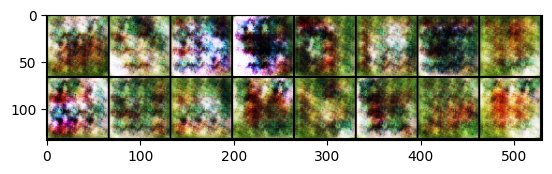

Epoch [7/10] | Step [0/204] | D Loss: -15.0956 | G Loss: -40.6469
Epoch [7/10] | Step [100/204] | D Loss: -13.4951 | G Loss: -59.3410
Epoch [7/10] | Step [200/204] | D Loss: -12.5293 | G Loss: -41.9261


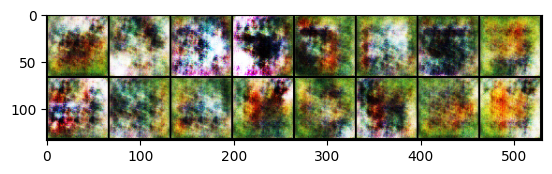

Epoch [8/10] | Step [0/204] | D Loss: -11.5544 | G Loss: -37.1436
Epoch [8/10] | Step [100/204] | D Loss: -8.4642 | G Loss: -49.0014
Epoch [8/10] | Step [200/204] | D Loss: -10.2396 | G Loss: -62.3672


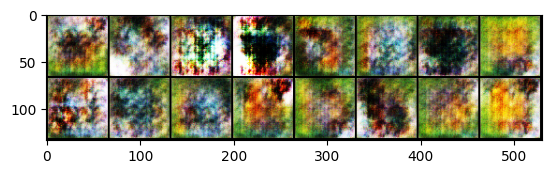

Epoch [9/10] | Step [0/204] | D Loss: -10.0888 | G Loss: -67.9317
Epoch [9/10] | Step [100/204] | D Loss: -5.6743 | G Loss: -65.8088
Epoch [9/10] | Step [200/204] | D Loss: -12.3960 | G Loss: -68.0306


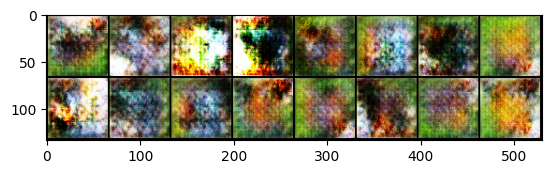

Plotting results...


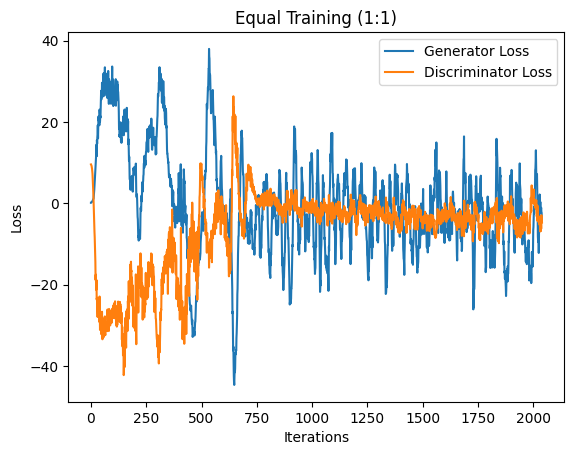

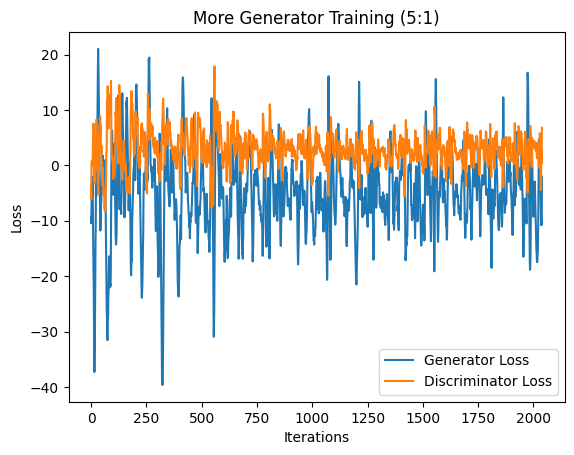

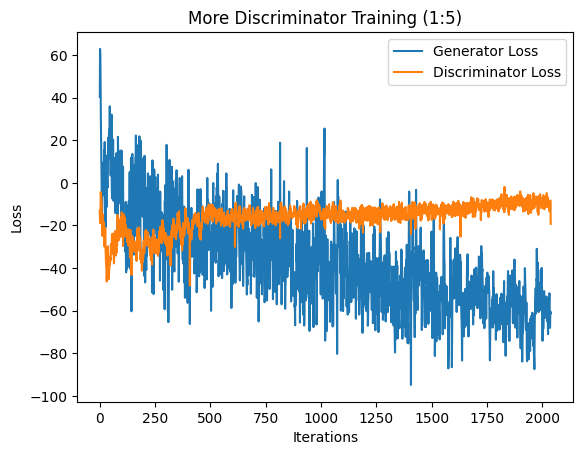

In [ ]:
import torch
import torchvision
import matplotlib.pyplot as plt
import numpy as np

# Set device to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f'Using device: {device}')

# Move generator and discriminator to the device (GPU or CPU)
generator.to(device)
discriminator.to(device)

# Hyperparameters
epochs = 10  # Number of training epochs
batch_size = 32
latent_dim = 100  # Size of the noise vector (input to generator)
lambda_gp = 10  # Gradient penalty weight for WGAN-GP
fixed_noise = torch.randn(16, latent_dim, 1, 1, device=device)  # Fixed noise for consistent visualization

# Lists to store losses for plotting
gen_losses_equal = []
dis_losses_equal = []
gen_losses_more_gen = []
dis_losses_more_gen = []
gen_losses_more_dis = []
dis_losses_more_dis = []

# Training loops for 3 different scenarios

def train_model(train_loader, gen_iterations, dis_iterations, gen_losses, dis_losses):
    for epoch in range(epochs):
        for i, (real_images, _) in enumerate(train_loader):
            real_images = real_images.to(device)
            batch_size = real_images.size(0)

            #### Train Discriminator (Critic) ####
            for _ in range(dis_iterations):
                noise = torch.randn(batch_size, latent_dim, 1, 1, device=device)
                fake_images = generator(noise)

                # Critic loss: WGAN-GP loss for real and fake images
                optimizer_dis.zero_grad()

                # Wasserstein loss: real images (maximize output, i.e., minimize negative)
                loss_real = -torch.mean(discriminator(real_images))

                # Wasserstein loss: fake images (minimize output)
                loss_fake = torch.mean(discriminator(fake_images.detach()))

                # Gradient Penalty
                gp = gradient_penalty(discriminator, real_images, fake_images, device=device)

                # Total critic loss (real + fake + gradient penalty)
                loss_dis = loss_real + loss_fake + lambda_gp * gp
                loss_dis.backward()
                optimizer_dis.step()

            #### Train Generator ####
            for _ in range(gen_iterations):
                optimizer_gen.zero_grad()

                # Generate fake images
                noise = torch.randn(batch_size, latent_dim, 1, 1, device=device)
                fake_images = generator(noise)

                # Generator loss: WGAN generator loss (minimize the negative critic output)
                loss_gen = -torch.mean(discriminator(fake_images))
                loss_gen.backward()
                optimizer_gen.step()

            # Store losses
            gen_losses.append(loss_gen.item())
            dis_losses.append(loss_dis.item())

            # Print progress every 100 batches
            if i % 100 == 0:
                print(f'Epoch [{epoch}/{epochs}] | Step [{i}/{len(train_loader)}] | '
                      f'D Loss: {loss_dis.item():.4f} | G Loss: {loss_gen.item():.4f}')

        # Generate and save some images at the end of each epoch for visualization
        with torch.no_grad():
            fake_images = generator(fixed_noise).detach().cpu()
            grid = torchvision.utils.make_grid(fake_images, padding=2, normalize=True)
            plt.imshow(np.transpose(grid, (1, 2, 0)))
            plt.show()

# Scenario 1: Train both generator and discriminator equally
print("Training with equal updates (1:1)...")
train_model(train_loader, gen_iterations=1, dis_iterations=1, gen_losses=gen_losses_equal, dis_losses=dis_losses_equal)

# Scenario 2: Train the generator 5 times per discriminator update
print("Training generator 5 times per discriminator (5:1)...")
train_model(train_loader, gen_iterations=5, dis_iterations=1, gen_losses=gen_losses_more_gen, dis_losses=dis_losses_more_gen)

# Scenario 3: Train the discriminator 5 times per generator update
print("Training discriminator 5 times per generator (1:5)...")
train_model(train_loader, gen_iterations=1, dis_iterations=5, gen_losses=gen_losses_more_dis, dis_losses=dis_losses_more_dis)

# Plotting the results
def plot_losses(gen_losses, dis_losses, title):
    plt.plot(gen_losses, label="Generator Loss")
    plt.plot(dis_losses, label="Discriminator Loss")
    plt.title(title)
    plt.xlabel("Iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

print("Plotting results...")

# Plot losses for equal training
plot_losses(gen_losses_equal, dis_losses_equal, "Equal Training (1:1)")

# Plot losses for more generator training (5:1)
plot_losses(gen_losses_more_gen, dis_losses_more_gen, "More Generator Training (5:1)")

# Plot losses for more discriminator training (1:5)
plot_losses(gen_losses_more_dis, dis_losses_more_dis, "More Discriminator Training (1:5)")


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
!unzip /content/animal.zip -d /content/

unzip:  cannot find or open /content/animal.zip, /content/animal.zip.zip or /content/animal.zip.ZIP.


Lets check the folder structure of the animal data

In [ ]:
def count_classes_and_images(root_dir):
    """
    Counts the number of classes (folders) and images in the dataset.

    Args:
    root_dir (str): The root directory path where the dataset is stored.

    Returns:
    tuple: Number of classes (folders) and number of images.
    """
    num_classes = 0
    num_images = 0

    # Iterate over all folders (classes)
    for class_folder in os.listdir(root_dir):
        class_path = os.path.join(root_dir, class_folder)

        if os.path.isdir(class_path):  # Check if it's a directory
            num_classes += 1

            # Count the number of images in this class folder
            images_in_class = [f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))]
            num_images += len(images_in_class)

    return num_classes, num_images

# Specify the root directory of your dataset
root_directory = "/content/Animals_data/animals/animals"

# Get the counts of classes and images
num_classes, num_images = count_classes_and_images(root_directory)

print(f"Number of classes (folders): {num_classes}")
print(f"Number of images: {num_images}")

FileNotFoundError: [Errno 2] No such file or directory: '/content/Animals_data/animals/animals'

The CustomDataset class in PyTorch is used to create a custom data loader that maps image filenames from the text file to their respective labels and loads the images from the specified directories. It allows flexibility in how data is loaded and preprocessed, especially when the dataset structure doesn’t follow typical folder-label conventions like in ImageFolder.

In [ ]:
class CustomDataset(Dataset):
    """
    A custom dataset class to load images and corresponding labels from folders.

    Attributes:
        root_dir (str): The root directory where the class folders and images are stored.
        class_to_idx (dict): A dictionary mapping class names to label indices.
        transform (callable, optional): Optional transformations to be applied on the images.
    """

    def __init__(self, txt_file, root_dir, transform=None):
        """
        Initializes the CustomDataset object.

        Args:
            txt_file (str): Path to the text file containing the class names (animal names).
            root_dir (str): Directory where the images are stored in class-labeled subfolders.
            transform (callable, optional): Optional transform to be applied on the image samples.
        """
        # Read the class names from the text file
        with open(txt_file, 'r') as f:
            self.classes = [line.strip() for line in f.readlines()]  # Read and clean class names

        # Create a dictionary to map class names to indices
        self.class_to_idx = {cls_name: idx for idx, cls_name in enumerate(self.classes)}

        # Root directory where the class-labeled folders and images are stored
        self.root_dir = root_dir
        self.transform = transform

        # Store the paths of all images and their corresponding labels
        self.image_paths = []
        self.labels = []

        # Iterate over each class folder and store the images and labels
        for class_name in os.listdir(root_dir):
            class_dir = os.path.join(root_dir, class_name)
            if os.path.isdir(class_dir):
                for img_name in os.listdir(class_dir):
                    img_path = os.path.join(class_dir, img_name)
                    if os.path.isfile(img_path):
                        self.image_paths.append(img_path)
                        self.labels.append(self.class_to_idx[class_name])  # Map folder name to label

    def __len__(self):
        """
        Returns the total number of samples (images) in the dataset.

        Returns:
            int: The length of the dataset (total number of images).
        """
        return len(self.image_paths)

    def __getitem__(self, idx):
        """
        Retrieves an image and its label at the specified index.

        Args:
            idx (int): Index of the sample to retrieve.

        Returns:
            image (Tensor): The transformed image tensor.
            label (int): The corresponding label for the image.
        """
        img_path = self.image_paths[idx]  # Get the image file path
        image = Image.open(img_path).convert("RGB")  # Open the image and convert to RGB

        label = self.labels[idx]  # Retrieve the label corresponding to the image

        if self.transform:
            image = self.transform(image)  # Apply transformations to the image

        return image, label  # Return the image and its label

Define the transformations

In [ ]:
transform = transforms.Compose(
    [
        transforms.Resize((128, 128)),  # Resize all images to 128x128 pixels
        transforms.ToTensor(),  # Convert images to tensor format
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # Normalize between -1 and 1
    ]
)

Initialize and verify the dataset

In [ ]:
# Define the path to the 'name of the animals.txt' file and the dataset root directory
txt_file = '/content/Animals_data/name of the animals.txt'
dataset_root_dir = '/content/Animals_data/animals/animals'

In [ ]:
# Initialize the dataset (no need for separate train and test datasets if the structure is combined)
dataset = CustomDataset(
    txt_file=txt_file,
    root_dir=dataset_root_dir,
    transform=transform  # Apply the 128x128 resize and other transformations
)

In [ ]:
# Check the dataset
print(f"Number of samples in the dataset: {len(dataset)}")

In [ ]:
# Split the dataset into training and testing sets
train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size
train_set, test_set = random_split(dataset, [train_size, test_size])

# Print the sizes of the train and test sets
print(f"Train set size: {len(train_set)}")
print(f"Test set size: {len(test_set)}")

In [ ]:
image_tensor = train_set[0][0]
pixel_size = image_tensor.shape  # This will give us (channels, height, width)
print(f"Image size (channels, height, width): {pixel_size}")

In [ ]:
# Define DataLoader for the training set
train_loader = DataLoader(
    train_set,  # The training dataset split
    batch_size=32,  # Number of images in each batch
    shuffle=True,  # Shuffle the dataset after each epoch for better training
    num_workers=4  # Number of subprocesses to use for data loading (speed up)
)

# Define DataLoader for the testing set
test_loader_animal = DataLoader(
    test_set,  # The testing dataset split
    batch_size=32,  # Number of images in each batch
    shuffle=False,  # No need to shuffle the test set
    num_workers=4  # Number of subprocesses to use for data loading
)

# Check if the DataLoaders work by accessing a batch of data
train_images, train_labels = next(iter(train_loader))
print(f"Train batch - Image batch shape: {train_images.size()}, Labels batch shape: {train_labels.size()}")

test_images, test_labels = next(iter(test_loader_animal))
print(f"Test batch - Image batch shape: {test_images.size()}, Labels batch shape: {test_labels.size()}")

### GenBlock and DisBlock along with Generator and Discriminator

In [ ]:
class GenBlock(nn.Module):
    """
    A building block for the Generator.
    Each block consists of a transposed convolution, followed by batch normalization and ReLU activation.
    This block helps upsample the input tensor to a larger spatial resolution.
    """

    def __init__(self, in_channels, out_channels, kernel_size=4, stride=2, padding=1):
        """
        Initialize the GenBlock.

        Args:
            in_channels (int): Number of input channels.
            out_channels (int): Number of output channels.
            kernel_size (int): Kernel size for the transposed convolution. Default is 4.
            stride (int): Stride for the transposed convolution. Default is 2.
            padding (int): Padding for the transposed convolution. Default is 1.
        """
        super(GenBlock, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)  # In-place ReLU activation for memory efficiency
        )

    def forward(self, x):
        """
        Forward pass through the GenBlock.

        Args:
            x (torch.Tensor): Input tensor of shape (batch_size, in_channels, height, width).

        Returns:
            torch.Tensor: Output tensor after transposed convolution, batch normalization, and ReLU activation.
        """
        return self.block(x)

In [ ]:
class Generator(nn.Module):
    """
    DCGAN Generator class.
    The Generator takes in a noise vector and progressively upsamples it through multiple layers
    to produce a synthetic image with spatial resolution of 128x128 and 3 channels (RGB).
    """

    def __init__(self, latent_dim=100, image_channels=3, feature_maps_g=64):
        """
        Initialize the Generator.

        Args:
            latent_dim (int): Dimension of the input noise vector. Default is 100.
            image_channels (int): Number of output image channels (3 for RGB). Default is 3.
            feature_maps_g (int): Number of feature maps in the generator. Default is 64.
        """
        super(Generator, self).__init__()

        self.net = nn.Sequential(
            # Latent vector (z) input of shape (batch_size, latent_dim, 1, 1)
            GenBlock(latent_dim, feature_maps_g * 8, kernel_size=4, stride=1, padding=0),  # 1x1 -> 4x4
            GenBlock(feature_maps_g * 8, feature_maps_g * 4),  # 4x4 -> 8x8
            GenBlock(feature_maps_g * 4, feature_maps_g * 2),  # 8x8 -> 16x16
            GenBlock(feature_maps_g * 2, feature_maps_g),  # 16x16 -> 32x32
            nn.ConvTranspose2d(feature_maps_g, image_channels, kernel_size=4, stride=2, padding=1),  # 32x32 -> 64x64
            nn.ConvTranspose2d(image_channels, image_channels, kernel_size=4, stride=2, padding=1),  # 64x64 -> 128x128
            nn.Tanh()  # Output pixel values in the range [-1, 1]
        )

    def forward(self, x):
        """
        Forward pass through the Generator network.

        Args:
            x (torch.Tensor): Input tensor (latent noise vector).

        Returns:
            torch.Tensor: Generated image tensor with shape (batch_size, 3, 128, 128) and pixel values in the range [-1, 1].
        """
        return self.net(x)


In [ ]:
class DisBlock(nn.Module):
    """
    A building block for the Discriminator.
    Each block consists of a convolution, followed by batch normalization and LeakyReLU activation.
    This block helps downsample the input tensor to reduce spatial resolution while maintaining critical features.
    """

    def __init__(self, in_channels, out_channels, kernel_size=4, stride=2, padding=1):
        """
        Initialize the DisBlock.

        Args:
            in_channels (int): Number of input channels.
            out_channels (int): Number of output channels.
            kernel_size (int): Kernel size for the convolution. Default is 4.
            stride (int): Stride for the convolution. Default is 2.
            padding (int): Padding for the convolution. Default is 1.
        """
        super(DisBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2, inplace=True),  # LeakyReLU allows for small negative gradients to avoid vanishing gradients
            nn.Dropout(0.3)  # Dropout to prevent overfitting during training
        )

    def forward(self, x):
        """
        Forward pass through the DisBlock.

        Args:
            x (torch.Tensor): Input tensor of shape (batch_size, in_channels, height, width).

        Returns:
            torch.Tensor: Output tensor after convolution, batch normalization, and LeakyReLU activation.
        """
        return self.block(x)

In [ ]:
class Discriminator(nn.Module):
    """
    Standard GAN Discriminator class.
    The Discriminator takes in an image and progressively downsamples it through multiple layers
    to produce a single scalar output (real or fake) using Sigmoid activation.
    """

    def __init__(self, image_channels=3, feature_maps_d=64):
        """
        Initialize the Discriminator.

        Args:
            image_channels (int): Number of input image channels (3 for RGB). Default is 3.
            feature_maps_d (int): Number of feature maps in the discriminator. Default is 64.
        """
        super(Discriminator, self).__init__()

        self.net = nn.Sequential(
            # Input: 128x128x3 -> 64x64x64
            nn.Conv2d(image_channels, feature_maps_d, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),

            # 64x64x64 -> 32x32x128
            DisBlock(feature_maps_d, feature_maps_d * 2),

            # 32x32x128 -> 16x16x256
            DisBlock(feature_maps_d * 2, feature_maps_d * 4),

            # 16x16x256 -> 8x8x512
            DisBlock(feature_maps_d * 4, feature_maps_d * 8),

            # 8x8x512 -> 4x4x1024
            DisBlock(feature_maps_d * 8, feature_maps_d * 16),

            # 4x4x1024 -> 1x1x1 (output scalar probability)
            nn.Conv2d(feature_maps_d * 16, 1, kernel_size=4, stride=1, padding=0),
            nn.Sigmoid()  # Output a probability between 0 (fake) and 1 (real)
        )

    def forward(self, x):
        """
        Forward pass through the Discriminator network.

        Args:
            x (torch.Tensor): Input tensor (real or fake image).

        Returns:
            torch.Tensor: Output scalar probability indicating whether the image is real (close to 1) or fake (close to 0).
        """
        return self.net(x).view(-1)  # Flatten the output to a single scalar per image

### Model Initialization

We initialize the generator and discriminator instances. The goal of the generator is to create synthetic data that is as realistic as possible so that the discriminator cannot distinguish between real and generated data. On the other hand, the discriminator’s goal is to correctly identify whether the data is real or synthetic.

In this setup, we are using the Binary Cross-Entropy Loss (BCE Loss) as the loss function. The generator and discriminator both use the same loss function, but their objectives are different:

The generator aims to minimize the loss by fooling the discriminator into classifying fake images as real.
The discriminator aims to correctly classify real images as real and fake images as fake, maximizing its ability to differentiate between the two.
BCE Loss is commonly used in standard GANs, where the discriminator outputs a probability (using Sigmoid activation) indicating whether the input image is real or fake. This probabilistic approach means that there is no need for additional constraints such as Gradient Penalty or weight clipping, which are required in Wasserstein GANs (WGAN). Instead, the model focuses on training the discriminator to improve its classification accuracy and the generator to create more convincing synthetic data.

In [ ]:
# Create the instance of 'Generator' and 'Discriminator' classes
generator = Generator()
discriminator = Discriminator()

# Define the loss function: Binary Cross-Entropy Loss (BCE Loss)
criterion = nn.BCELoss()

# Defining the optimizers (using Adam for standard GAN)
optimizer_gen = optim.Adam(generator.parameters(), lr=0.0003, betas=(0.5, 0.999))  # Adam optimizer for Generator
optimizer_dis = optim.Adam(discriminator.parameters(), lr=0.0001, betas=(0.5, 0.999))  # Adam optimizer for Discriminator

# Set the device to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move models to the device (GPU/CPU)
generator.to(device)
discriminator.to(device)

# Print the model architectures to verify the setup
print(generator)
print(discriminator)

#### Training the GAN with the Animal Dataset
Now that we have the generator, discriminator, loss function, and optimizers defined, the next step is to create the training loop. This is where the actual adversarial "game" between the generator and discriminator takes place. The generator tries to produce realistic images, while the discriminator tries to distinguish between real images from the animal dataset and fake images generated by the generator.

#####Training Process Overview:

**Training the Discriminator:**

The discriminator is trained to distinguish between real images from the animal dataset and fake images generated by the generator.
We pass real animal images from the dataset to the discriminator and assign them the label "1" (real).
We then generate fake images using the generator from random noise and pass them through the discriminator, assigning them the label "0" (fake).
The discriminator tries to maximize the difference between real and fake by learning to output values close to 1 for real images and 0 for fake images.

**Training the Generator:**

The generator is trained to fool the discriminator by generating animal images that the discriminator classifies as real.
We generate fake animal images from random noise, pass them through the discriminator, and aim to make the discriminator classify them as real (label "1").
The generator's loss is computed based on how well it can "trick" the discriminator into thinking the generated (fake) images are real. In other words, the generator is trained to maximize the discriminator’s output for fake images, making the fake images more realistic over time.
Key Steps in Each Training Iteration:

**Train the Discriminator:**
Pass real images from the animal dataset to the discriminator with real labels.
Generate fake images using the generator and pass them to the discriminator with fake labels.
Update the discriminator's parameters to correctly classify real vs. fake images.

**Train the Generator:**
Generate new fake images from random noise.
Pass the fake images through the discriminator, aiming to make the discriminator classify them as real.
Update the generator’s parameters based on the discriminator’s feedback, so the generator improves at producing realistic animal images.


In [ ]:
# Set device to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f'Using device: {device}')

# Move generator and discriminator to the device (GPU or CPU)
generator.to(device)
discriminator.to(device)

# Hyperparameters
epochs = 300  # Number of training epochs
batch_size = 32
latent_dim = 100  # Size of the noise vector (input to generator)

# Loss function: Binary Cross-Entropy Loss (BCE Loss)
criterion = nn.BCELoss()

# Optimizers: Adam for both generator and discriminator
optimizer_gen = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_dis = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

# Create fixed noise for generating images later
fixed_noise = torch.randn(16, latent_dim, 1, 1, device=device)

# Lists to store losses for plotting
gen_losses = []
dis_losses = []

# Training Loop
for epoch in range(epochs):
    for i, (real_images, _) in enumerate(train_loader):
        real_images = real_images.to(device)
        batch_size = real_images.size(0)

        #### Train Discriminator ####
        optimizer_dis.zero_grad()

        # Create labels for real and fake images
        real_labels = torch.full((batch_size, 1), 0.9, device=device)  # Real images labeled as 1
        fake_labels = torch.zeros(batch_size, 1, device=device)  # Fake images labeled as 0

        # Forward pass real images through discriminator
        output_real = discriminator(real_images).view(-1, 1)
        loss_real = criterion(output_real, real_labels)  # Loss for real images

        # Generate fake images
        noise = torch.randn(batch_size, latent_dim, 1, 1, device=device)
        fake_images = generator(noise)  # Correct input to generator: (batch_size, latent_dim, 1, 1)

        # Forward pass fake images through discriminator
        output_fake = discriminator(fake_images.detach()).view(-1, 1)
        loss_fake = criterion(output_fake, fake_labels)  # Loss for fake images

        # Total discriminator loss
        loss_dis = loss_real + loss_fake
        loss_dis.backward()
        optimizer_dis.step()

        #### Train Generator ####
        optimizer_gen.zero_grad()

        # Generate fake images and forward pass through discriminator again
        output_fake = discriminator(fake_images).view(-1, 1)
        loss_gen = criterion(output_fake, real_labels)  # Generator tries to fool discriminator

        loss_gen.backward()
        optimizer_gen.step()

        # Store losses for later plotting
        gen_losses.append(loss_gen.item())
        dis_losses.append(loss_dis.item())

        # Print progress every 100 batches
        if i % 100 == 0:
            print(f'Epoch [{epoch}/{epochs}] | Step [{i}/{len(train_loader)}] | '
                  f'D Loss: {loss_dis.item():.4f} | G Loss: {loss_gen.item():.4f}')

    # Generate and display images at the end of each epoch
    with torch.no_grad():
        fake_images = generator(fixed_noise).detach().cpu()
        grid = torchvision.utils.make_grid(fake_images, padding=2, normalize=True)
        plt.imshow(np.transpose(grid, (1, 2, 0)))
        plt.show()

# Save the models after all epochs are completed
torch.save(generator.state_dict(), 'generator_final.pth')
torch.save(discriminator.state_dict(), 'discriminator_final.pth')

print("Models saved after all epochs.")


Plot the generator and discriminator loss curves

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(gen_losses, label="Generator Loss")
plt.plot(dis_losses, label="Discriminator Loss")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.title("Generator and Discriminator Loss During Training")
plt.legend()
plt.show()

Plot a 10 by 10 grid of images for generated images.

In [ ]:
with torch.no_grad():
    # Generate 100 images for a 10x10 grid
    noise = torch.randn(100, latent_dim, 1, 1, device=device)
    generated_images = generator(noise)

    # Create a 10x10 grid of images
    grid = torchvision.utils.make_grid(generated_images, nrow=10, padding=2, normalize=True)

    # Plot the 10x10 grid of images
    plt.figure(figsize=(10, 10))
    plt.imshow(np.transpose(grid.cpu(), (1, 2, 0)))  # Transpose the image dimensions for matplotlib
    plt.axis("off")  # Turn off the axis
    plt.show()